In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.dpi']=400
df = pd.read_csv('Wholesale.csv')
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,12669,9656,7561,214,2674,1338
1,2,3,7057,9810,9568,1762,3293,1776
2,2,3,6353,8808,7684,2405,3516,7844
3,1,3,13265,1196,4221,6404,507,1788
4,2,3,22615,5410,7198,3915,1777,5185


In [2]:
df['Channel'].value_counts()

1    298
2    142
Name: Channel, dtype: int64

In [3]:
df['Region'].value_counts()

3    316
1     77
2     47
Name: Region, dtype: int64

In [16]:
grouped = df.groupby(['Channel'])['Fresh','Milk', 'Grocery', 
                                  'Frozen', 'Detergents_Paper',
                                  'Delicassen'].mean()

C:\Users\psahai\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


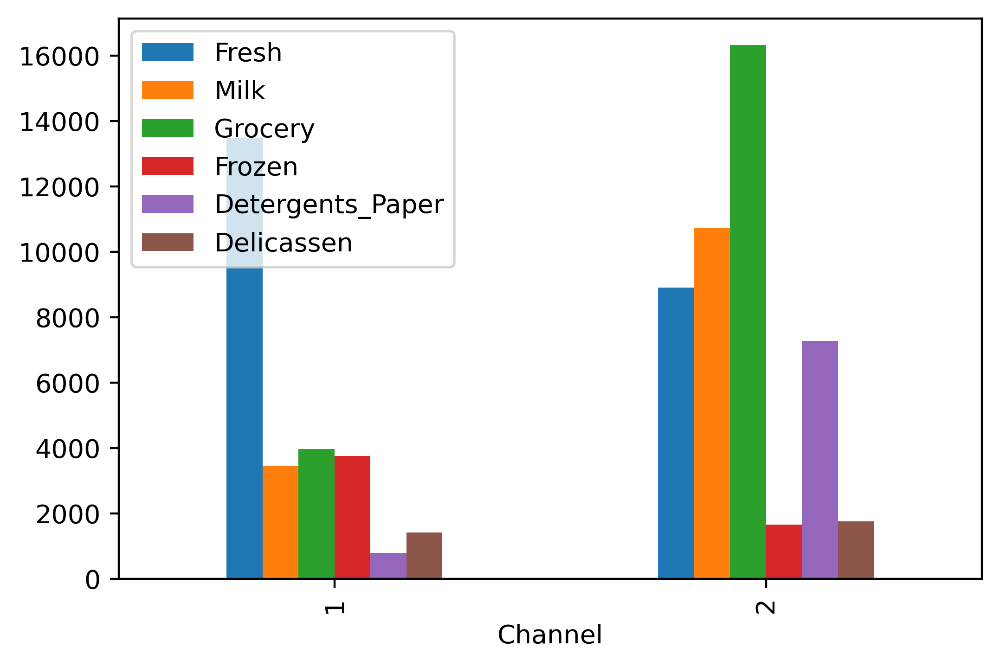

In [17]:
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.dpi']=400
grouped.plot(kind='bar')

C:\Users\psahai\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


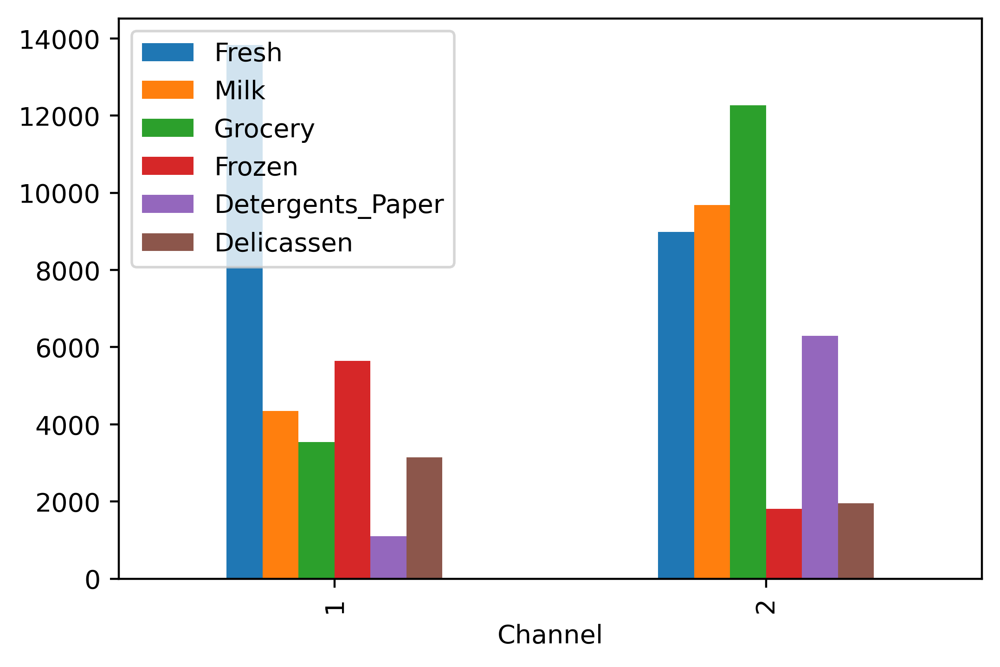

In [18]:
grouped2 = df.groupby(['Channel'])['Fresh','Milk', 'Grocery', 
                                  'Frozen', 'Detergents_Paper',
                                  'Delicassen'].std()
mpl.rcParams['figure.dpi']=400
grouped2.plot(kind='bar')

In [6]:
wholesale = df.drop(['Channel', 'Region'], axis=1)

In [8]:
wholesale.agg(['mean', 'std']).round(0)

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
mean,12000.0,5796.0,7951.0,3072.0,2881.0,1525.0
std,12647.0,7380.0,9503.0,4855.0,4768.0,2820.0


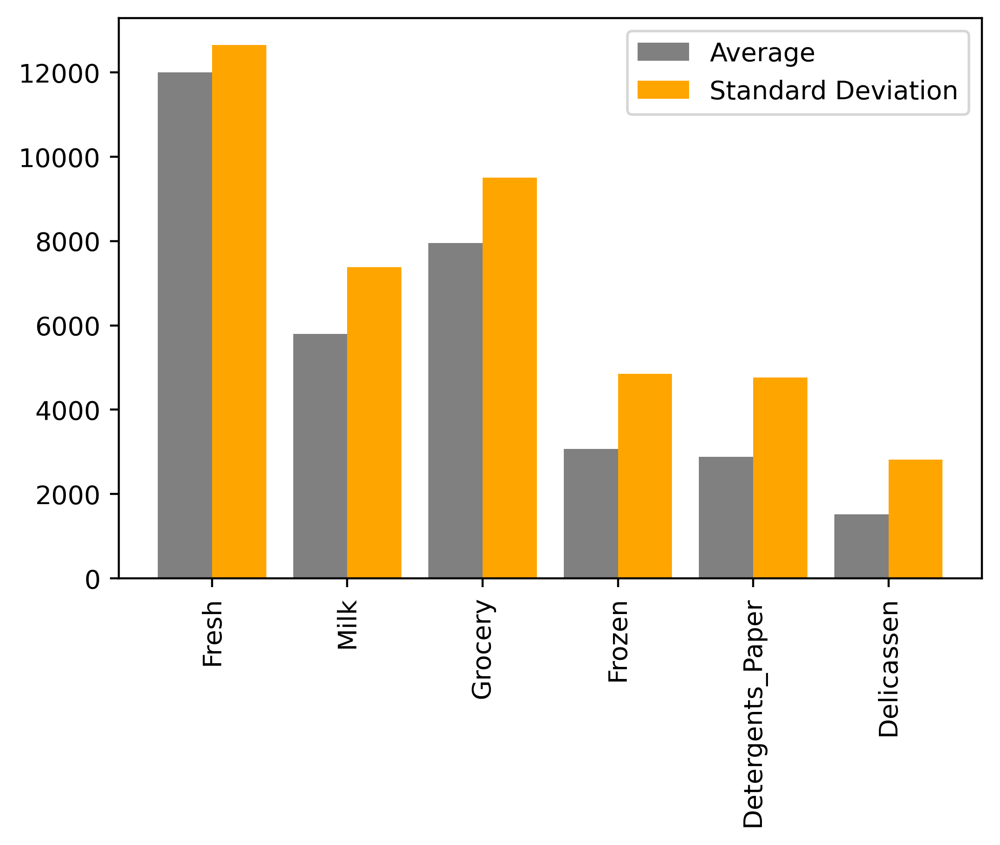

In [13]:
averages = wholesale.mean()
st_dev = wholesale.std()
x_names = wholesale.columns
x_ix = np.arange(wholesale.shape[1])
plt.bar(x_ix-0.2, averages, color='grey', label='Average', width=0.4)
plt.bar(x_ix+0.2, st_dev, color='orange', label='Standard Deviation', width=0.4)
plt.xticks(x_ix, x_names, rotation=90)
plt.legend()
plt.show()

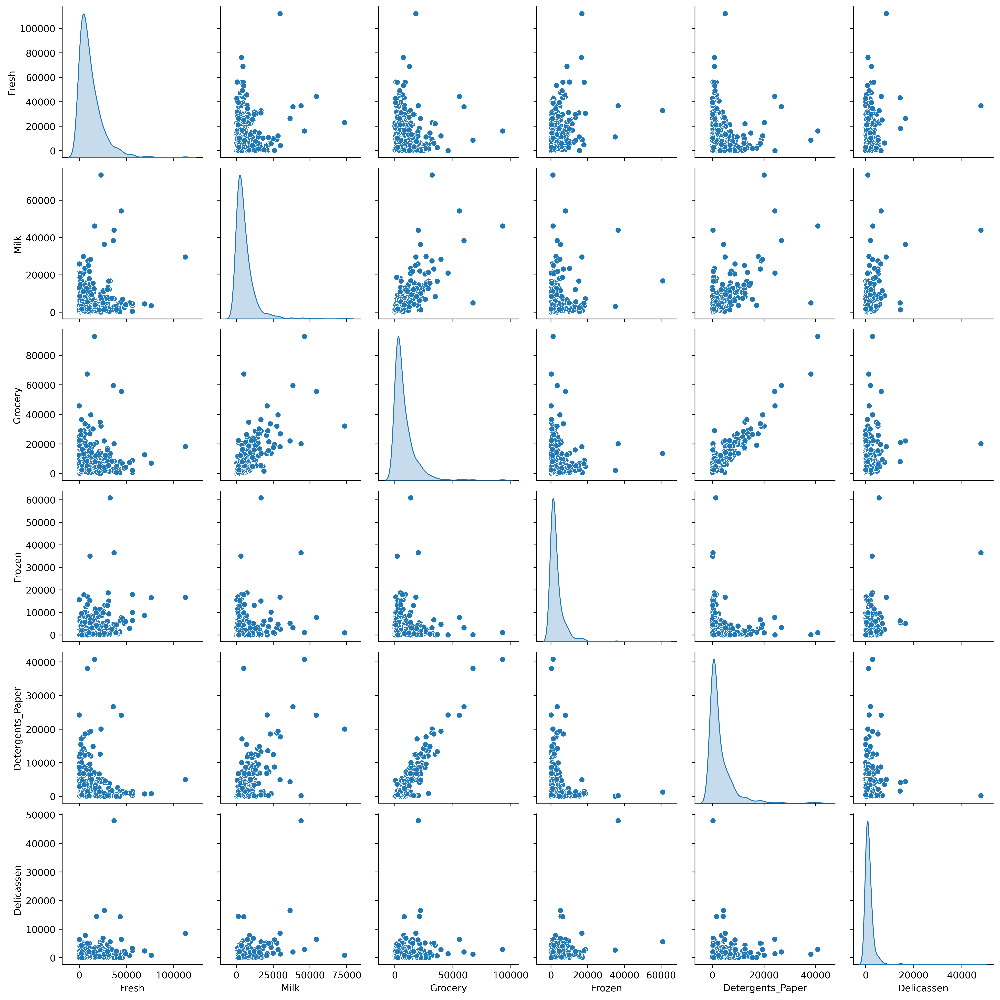

In [19]:
import seaborn as sns
sns.pairplot(wholesale, diag_kind='kde') #Kernel density estimate
plt.show()

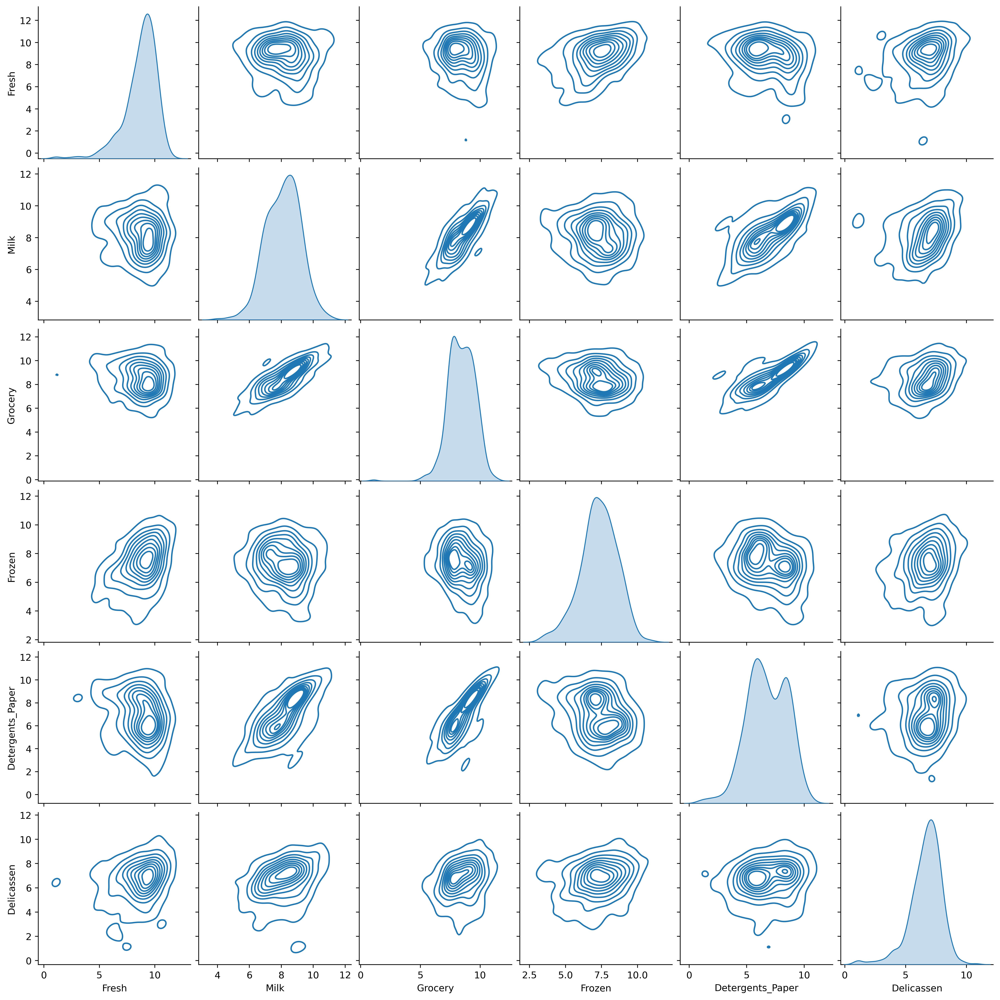

In [20]:
wholesale_log = np.log(wholesale)
sns.pairplot(wholesale_log, kind='kde')
plt.show()

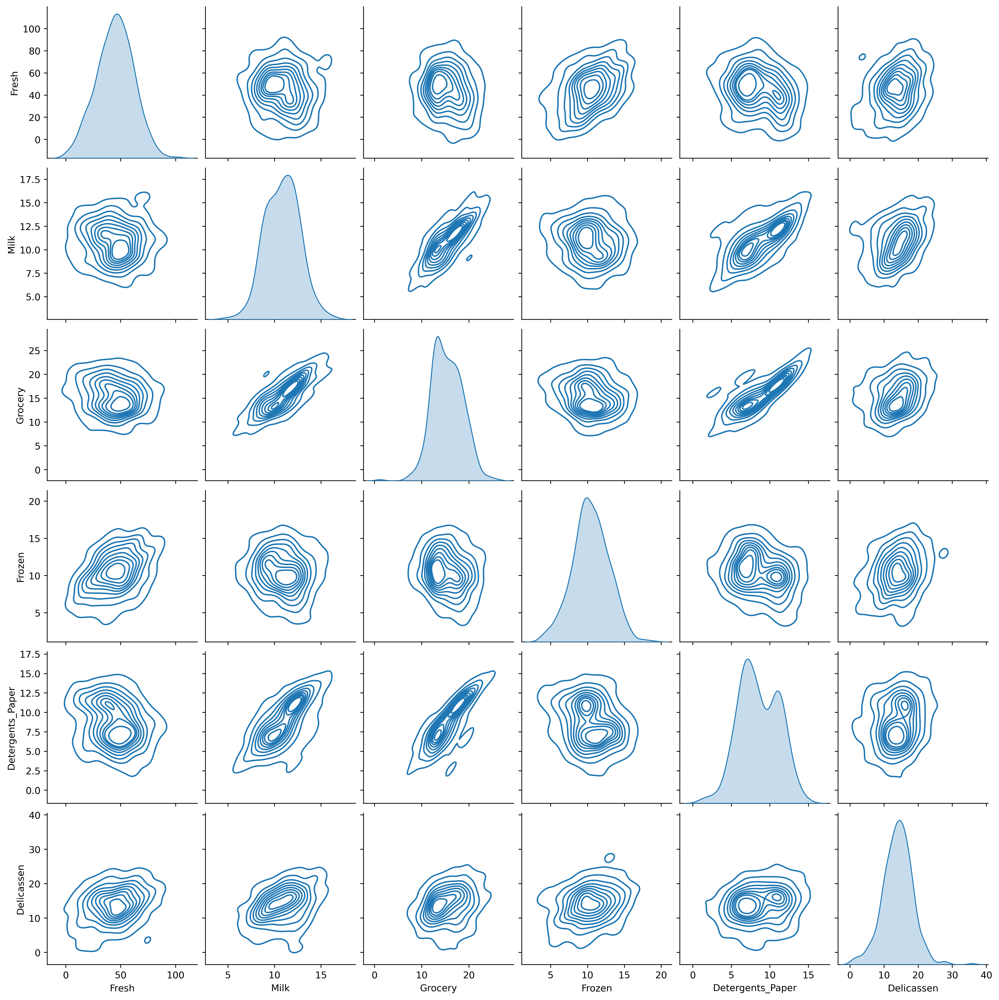

In [22]:
from scipy import stats
def boxcox_df(x):
    x_boxcox, _ = stats.boxcox(x)
    return x_boxcox
wholesale_boxcox = wholesale.apply(boxcox_df, axis=0)
sns.pairplot(wholesale_boxcox, kind='kde')
plt.show()

In [24]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(wholesale_boxcox)
wholesale_scaled = scaler.transform(wholesale_boxcox)
wholesale_scaled_df = pd.DataFrame(data=wholesale_scaled,
                                  index=wholesale_boxcox.index,
                                  columns=wholesale_boxcox.columns)
wholesale_scaled_df.agg(['mean', 'std']).round()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
mean,-0.0,0.0,-0.0,-0.0,-0.0,0.0
std,1.0,1.0,1.0,1.0,1.0,1.0


In [25]:
# from sklearn.cluster import KMeans
# kmeans = KMeans(n_clusters=k)
# kmeans.fit(wholesale_scaled_df)
# wholesale_kmeans4 = wholesale.assign(segment=kmeans.labels_)

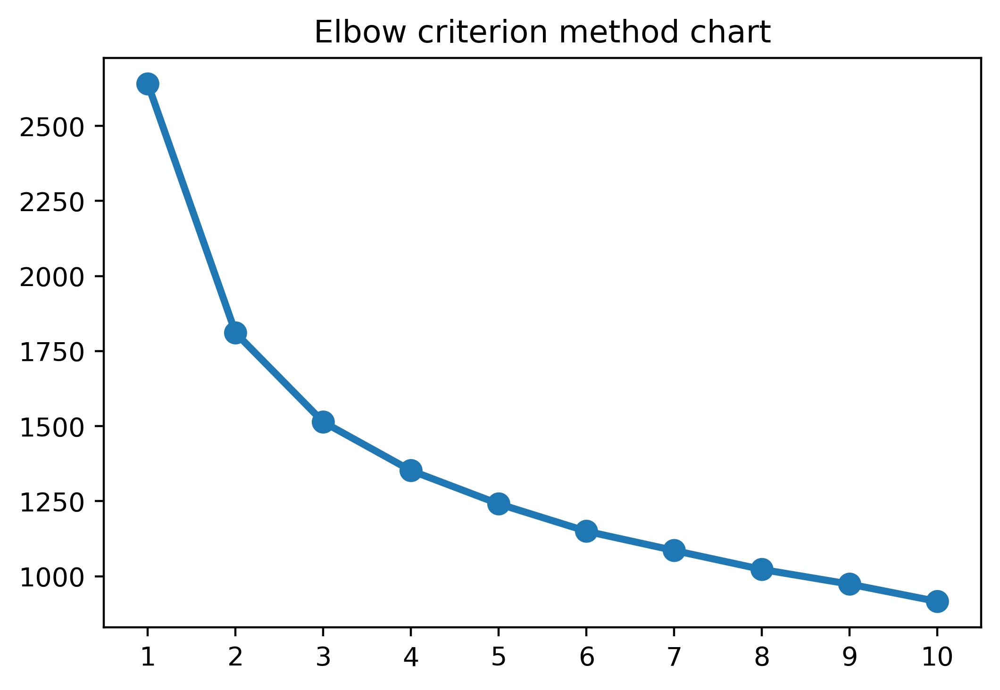

In [27]:
sse = {}
for k in range(1,11):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(wholesale_scaled_df)
    sse[k]=kmeans.inertia_
plt.title('Elbow criterion method chart')
sns.pointplot(x=list(sse.keys()), y=list(sse.values()))
plt.show()

In [40]:
kmeans=KMeans(n_clusters=3)
kmeans.fit(wholesale_scaled_df)
wholesale_kmeans3 = wholesale.assign(segment = kmeans.labels_)

           Fresh     Milk  Grocery  Frozen  Detergents_Paper  Delicassen
segment                                                                 
0        26244.0   7767.0   7769.0  7836.0            1653.0      3770.0
1         6363.0  10004.0  15539.0  1236.0            6904.0      1362.0
2        10526.0   2012.0   2576.0  2543.0             471.0       771.0


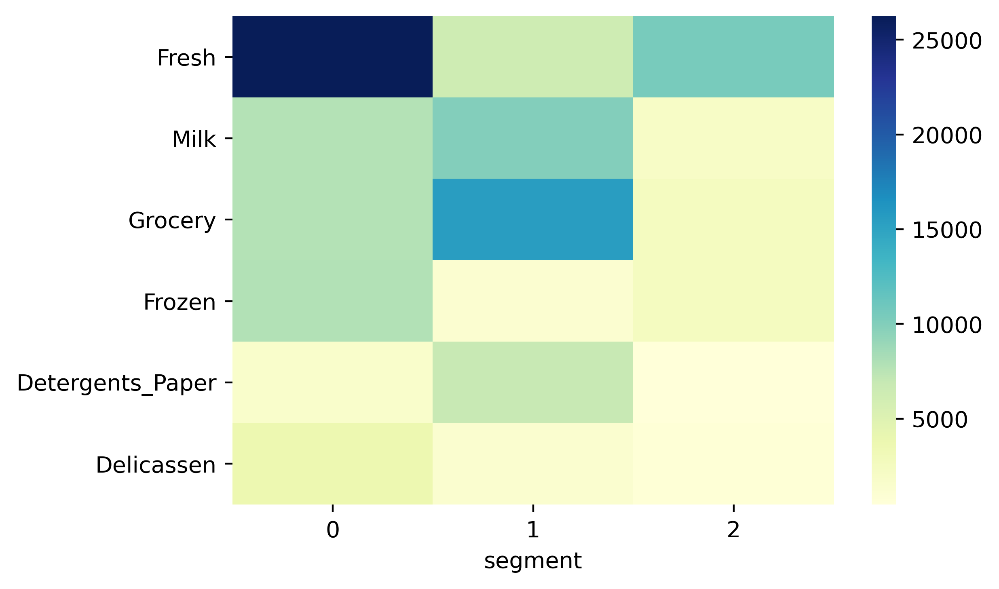

In [41]:
kmeans3_averages = wholesale_kmeans3.groupby(['segment']).mean().round(0)
print(kmeans3_averages)
sns.heatmap(kmeans3_averages.T, cmap='YlGnBu')
plt.show()

In [42]:
from sklearn.decomposition import NMF
nmf = NMF(3)
nmf.fit(wholesale)
components = pd.DataFrame(data=nmf.components_, columns=wholesale.columns)

In [43]:
segment_weights = pd.DataFrame(nmf.transform(wholesale), columns=components.index)
segment_weights.index = wholesale.index
wholesale_nmf = wholesale.assign(segment=segment_weights.idxmax(axis=1))

In [44]:
wholesale_kmeans4

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen,segment
0,12669,9656,7561,214,2674,1338,1
1,7057,9810,9568,1762,3293,1776,1
2,6353,8808,7684,2405,3516,7844,0
3,13265,1196,4221,6404,507,1788,0
4,22615,5410,7198,3915,1777,5185,0
...,...,...,...,...,...,...,...
435,29703,12051,16027,13135,182,2204,0
436,39228,1431,764,4510,93,2346,0
437,14531,15488,30243,437,14841,1867,1
438,10290,1981,2232,1038,168,2125,2


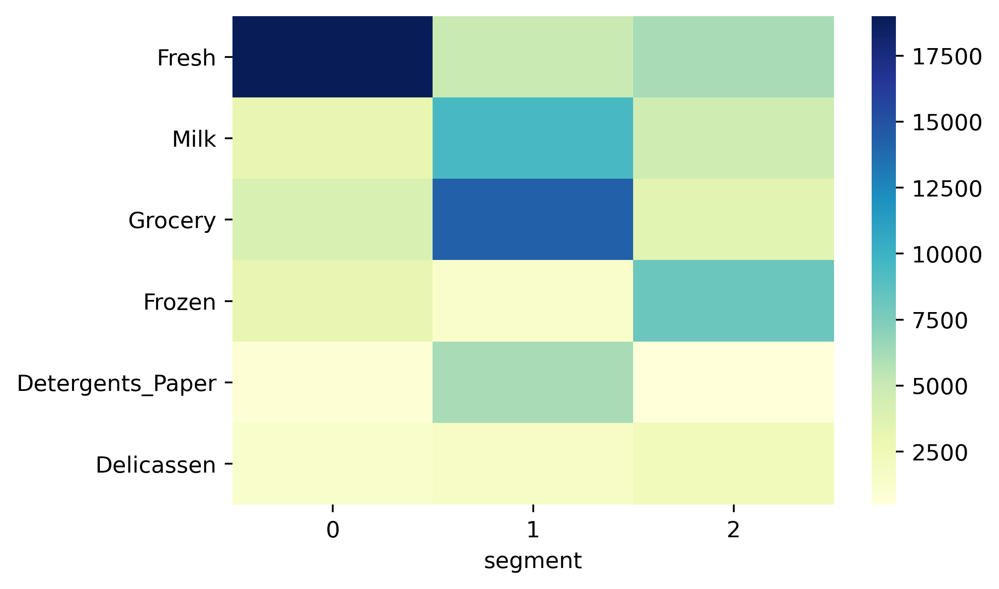

In [45]:
W = pd.DataFrame(data=nmf.transform(wholesale), columns=components.index)
W.index = wholesale.index
wholesale_nmf3 = wholesale.assign(segment = W.idxmax(axis=1))
nmf3_averages = wholesale_nmf3.groupby('segment').mean().round(0)
sns.heatmap(nmf3_averages.T, cmap='YlGnBu')
plt.show()